In [1]:
import os
import random
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image
from sklearn.model_selection import train_test_split


In [2]:

shirt_data_path = "training-shirt-data"
art_data_path = "final_art_data"


In [3]:
import os
import numpy as np
from PIL import Image
import torchvision.transforms as transforms

In [4]:
def load_images(folder):
    images = []
    for root, _, files in os.walk(folder):
        for file in files:
            img_path = os.path.join(root, file)
            try:
                img = Image.open(img_path)
                images.append(np.array(img))
            except Exception as e:
                print(f"Error loading image {img_path}: {e}")
    return images




shirt_images = load_images(shirt_data_path)
print(f"shirt images: {len(shirt_images)}")
art_images = load_images(art_data_path)
print(f"art images: {len(art_images)}")

shirt images: 1609
art images: 622


In [5]:
def dataset_dimension(images):
    print(f"Dataset contains {len(images)} images.")
    print(f"Image dimensions: {images[0].shape if all(img.shape == images[0].shape for img in images) else 'none'}")

dataset_dimension(shirt_images)
dataset_dimension(art_images)


Dataset contains 1609 images.
Image dimensions: (768, 768, 3)
Dataset contains 622 images.
Image dimensions: (768, 768, 3)


In [6]:
def normalize_images(images):
    normalized_images = []
    
    for image in images:
        image = image.astype(np.float32) / 255.0
        # Scale to [-1, 1]
        image = (image * 2.0) - 1.0
        normalized_images.append(image)
        
    return normalized_images

shirt_images = normalize_images(shirt_images)
art_images = normalize_images(art_images)

In [7]:
# Step 2: Train/Test Split Details
def split_details(images, entity = ''):
    train_images, test_images = train_test_split(
        images, test_size=0.1, random_state=42
    )
    print(f"{entity} Training set size: {len(train_images)}, Test set size: {len(test_images)}")
    return train_images, test_images

train_shirt_images, test_shirt_images = split_details(shirt_images, "SHIRT")
train_art_images, test_art_images = split_details(art_images, "ART")
shirt_images=[]
art_images=[]

SHIRT Training set size: 1448, Test set size: 161
ART Training set size: 559, Test set size: 63


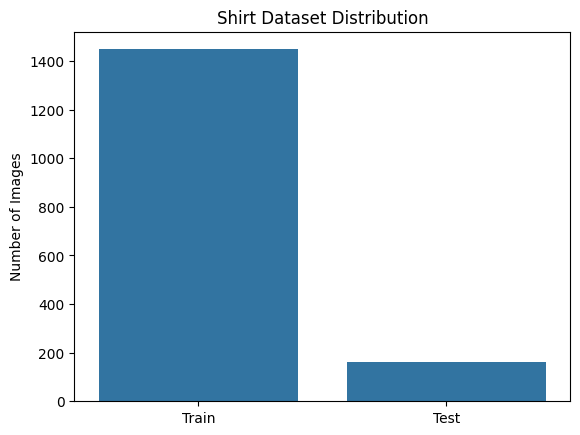

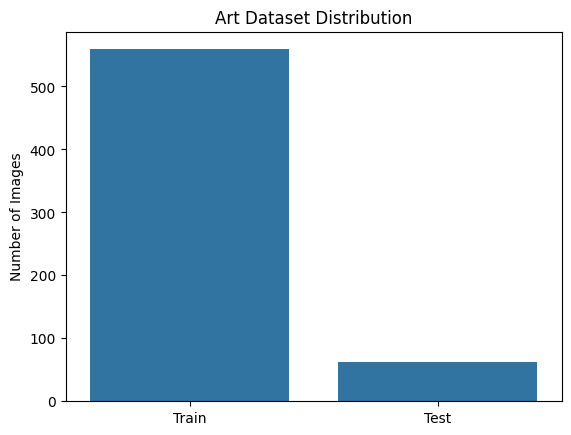

In [9]:
def dataset_distribution(train_count, test_count, title=""):
    categories = ["Train", "Test"]
    counts = [train_count, test_count]
    sns.barplot(x=categories, y=counts)
    plt.title(f"{title} Dataset Distribution")
    plt.ylabel("Number of Images")
    plt.show()

dataset_distribution(len(train_shirt_images),len(test_shirt_images), "Shirt")

dataset_distribution(len(train_art_images),len(test_art_images), "Art")



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


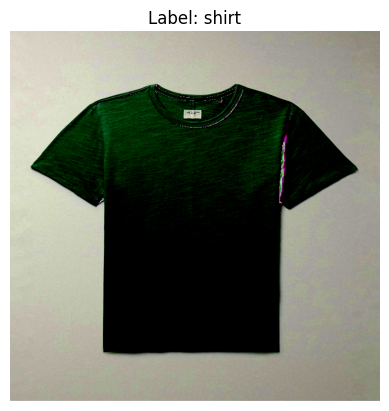

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


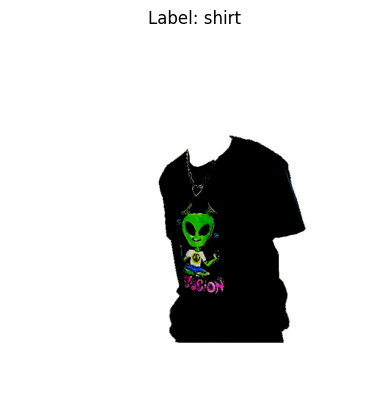

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


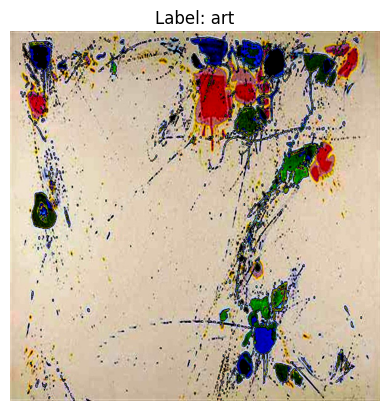

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


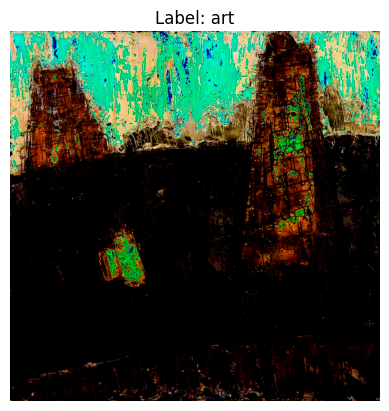

In [10]:
# Step 5: Sample Images
def display_sample_images(images, num=1, label=""):
    indices = random.sample(range(len(images)), num)
    for idx in indices:
        plt.imshow(images[idx])
        plt.title(f"Label: {label}")
        plt.axis("off")
        plt.show()

display_sample_images(train_shirt_images, 2,"shirt")
display_sample_images(train_art_images, 2,"art")

### Thumbnails

In [11]:
def display_thumbnails(images, label=''):
    fig, axes = plt.subplots(10, 10, figsize=(10, 10))
    for i, ax in enumerate(axes.ravel()):
        idx = random.randint(0, len(images) - 1)
        ax.imshow(images[idx])
        #ax.set_title(f'{label}')
        ax.axis("off")
    plt.tight_layout()
    plt.show()



- Training Shirt Overview

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

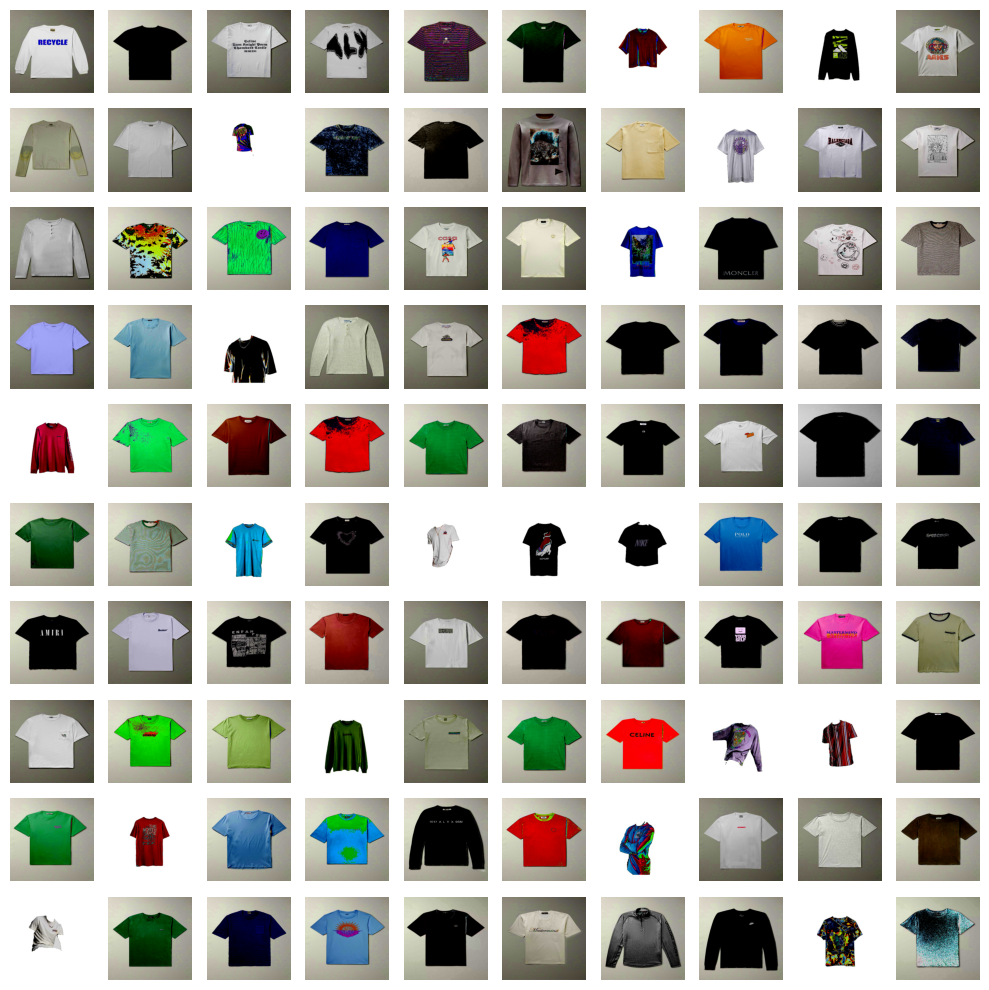

In [12]:
display_thumbnails(train_shirt_images, "Training Shirt Images")

- Training Art Overview

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

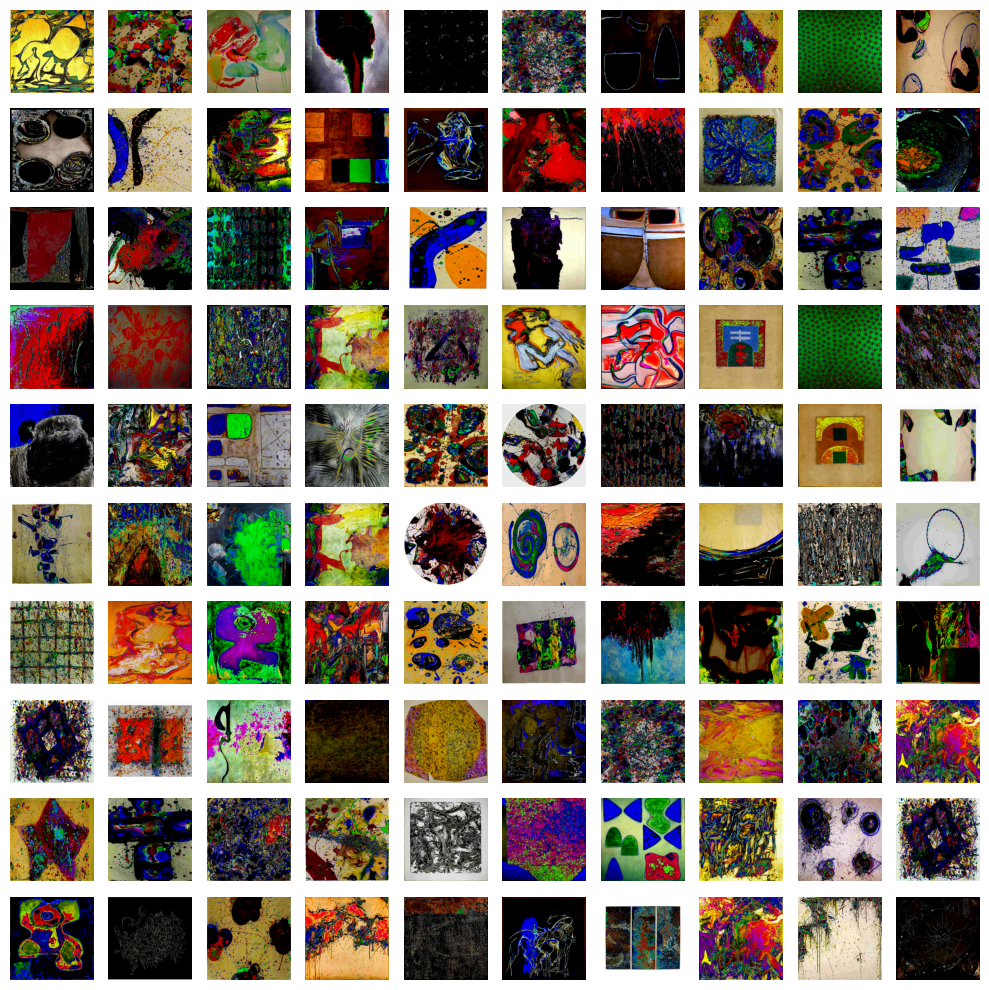

In [13]:
display_thumbnails(train_art_images, "Training art Images")

In [14]:
def check_pixel_range(images):
    """
    Check the minimum and maximum pixel values in a list of images.
    
    Parameters:
    images (list): List of image arrays
    
    Returns:
    dict: Min and max pixel values across all images
    """
    if not images:
        return {"error": "Empty image list"}
        
    min_val = float('inf')
    max_val = float('-inf')
    
    for i, img in enumerate(images):
        curr_min = img.min()
        curr_max = img.max()
        
        min_val = min(min_val, curr_min)
        max_val = max(max_val, curr_max)
    
    return {
        "lowest_pixel_value": float(min_val),
        "highest_pixel_value": float(max_val)
    }

results = check_pixel_range(shirt_images)
print(f"Lowest pixel value: {results['lowest_pixel_value']}")
print(f"Highest pixel value: {results['highest_pixel_value']}")

Lowest pixel value: -1.0
Highest pixel value: 1.0


## Image Pixel Histogram

In [22]:
import matplotlib.pyplot as plt

def plot_histogram(shirt_images):
    colors = ['red', 'green', 'blue']
    channel_names = ['Red Channel', 'Green Channel', 'Blue Channel']
    
    # Create a figure with subplots
    plt.figure(figsize=(15, 5))
    
    for i in range(3):  # Loop over the three color channels
        plt.subplot(1, 3, i + 1)
        
        # Concatenate all images along the first axis to create a single array of pixel values
        all_pixels = np.concatenate([img[:, :, i].flatten() for img in shirt_images])
        
        # Plot histogram
        plt.hist(all_pixels, bins=50, color=colors[i], alpha=0.7)
        plt.title(channel_names[i])
        plt.xlabel('Pixel Intensity')
        plt.ylabel('Frequency')
        plt.xlim(-1, 1)  # Since the pixel values are normalized between -1 and 1
    
    plt.tight_layout()
    plt.show()




- Shirt images histogram

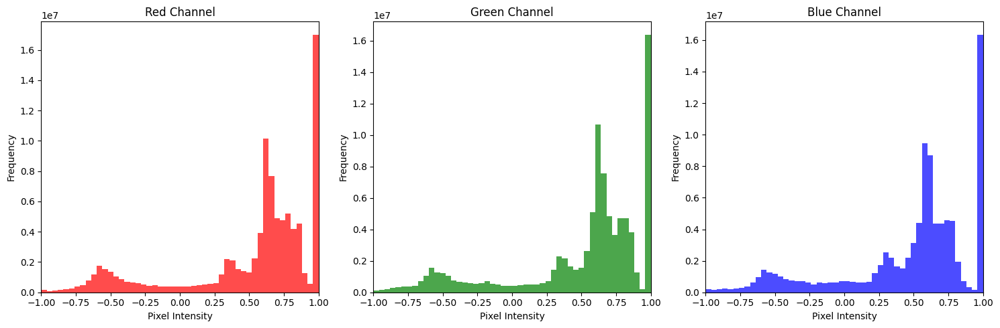

In [26]:
plot_histogram(test_shirt_images)

- Art images Color intensity

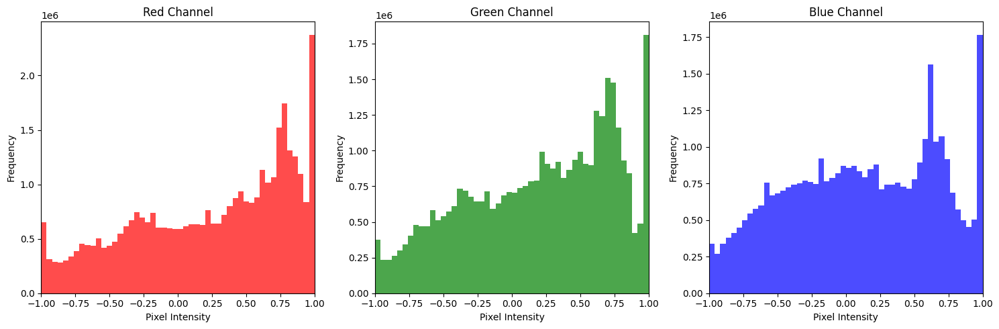

In [27]:
plot_histogram(test_art_images)

### Channel Seperation Example

In [8]:
del shirt_images
del art_images
del train_shirt_images
del train_art_images


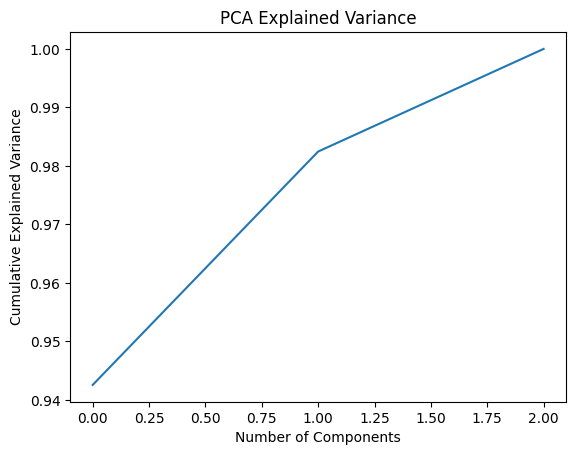

KeyboardInterrupt: 

In [9]:
import cv2
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

def extract_rgb_values(images):
    rgb_values = []
    for img in images:
        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        rgb_values.append(img_rgb.reshape(-1, 3))
    return np.vstack(rgb_values)

def perform_pca(rgb_values):
    pca = PCA(n_components=3)
    pca.fit(rgb_values)
    
    plt.plot(np.cumsum(pca.explained_variance_ratio_))
    plt.xlabel('Number of Components')
    plt.ylabel('Cumulative Explained Variance')

    plt.title('PCA Explained Variance')

    plt.show()
    rgb_pca = pca.transform(rgb_values)
    plt.scatter(rgb_pca[:, 0], rgb_pca[:, 1], c=rgb_values[:, 0], cmap='viridis')
    plt.xlabel('Principal Component 1')
    plt.ylabel('Principal Component 2')
    plt.title('PCA Scatter Plot')
    plt.show()
    del pca

rgb_values = extract_rgb_values(test_shirt_images)

perform_pca(rgb_values)

In [15]:
del rgb_values

In [ ]:
def color_channel_separation(image):
    red_channel = image[:, :, 0]
    green_channel = image[:, :, 1]
    blue_channel = image[:, :, 2]

    _, axes = plt.subplots(1, 4, figsize=(10, 3))
    axes[0].imshow(red_channel, cmap="Reds")
    axes[0].set_title("Red Channel")
    axes[1].imshow(green_channel, cmap="Greens")
    axes[1].set_title("Green Channel")
    axes[2].imshow(blue_channel, cmap="Blues")
    axes[2].set_title("Blue Channel")
    axes[3].imshow(image)
    axes[3].set_title("Original")
    plt.show()


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


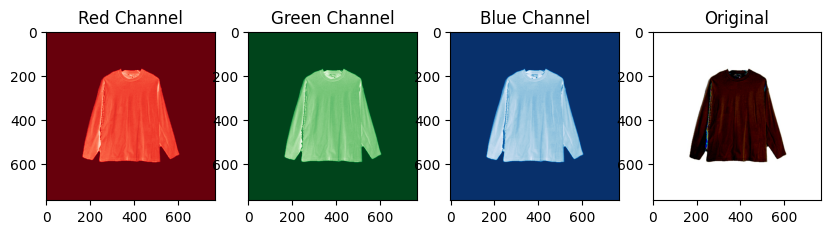

In [ ]:
color_channel_separation(train_shirt_images[7])

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


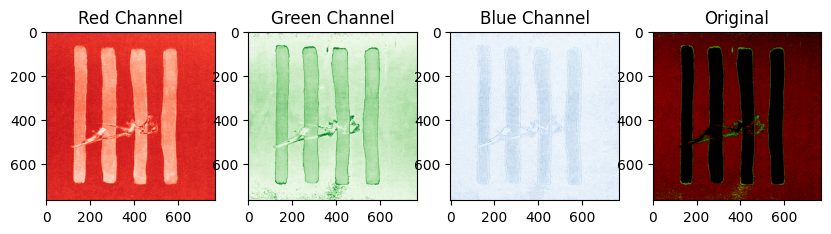

In [42]:
color_channel_separation(train_art_images[6])

## Sample Heatmap

In [43]:
def plot_heatmap(image):
    plt.imshow(np.mean(image, axis=2), cmap="hot")
    plt.title("Heatmap of Pixel Intensity")
    plt.colorbar()
    plt.show()


- Shirt Heatmaps

Heatmap for image 1


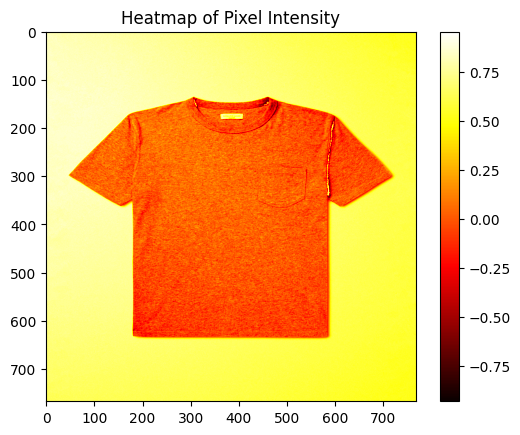

Heatmap for image 2


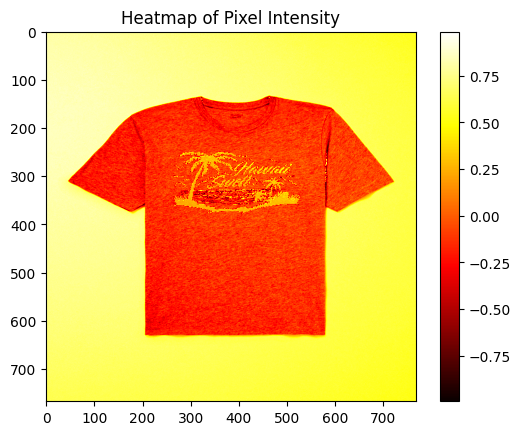

Heatmap for image 3


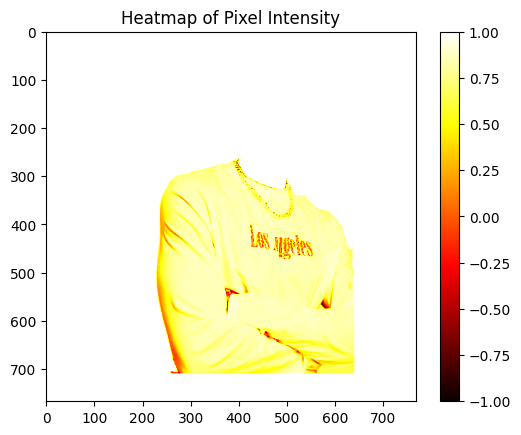

Heatmap for image 4


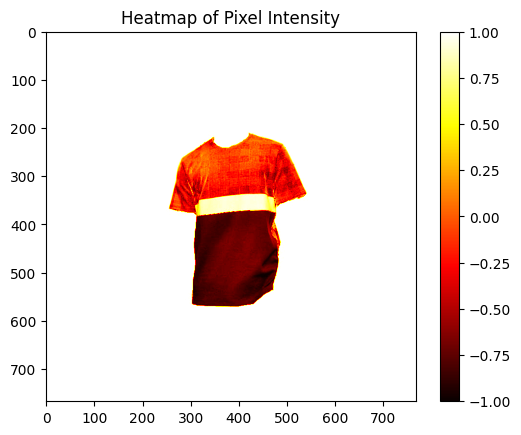

Heatmap for image 5


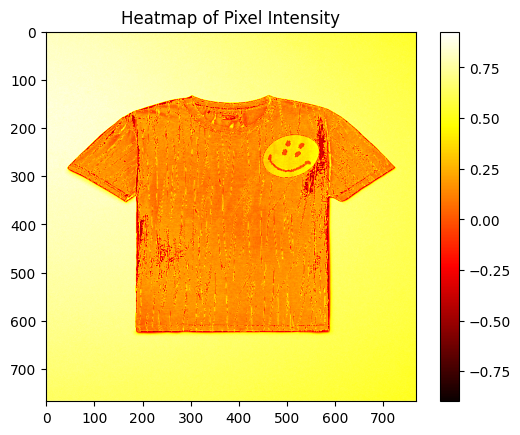

In [44]:
for idx, img in enumerate(train_shirt_images[:5]):
    print(f"Heatmap for image {idx + 1}")
    plot_heatmap(img)

- Art Heatmaps

Heatmap for image 1


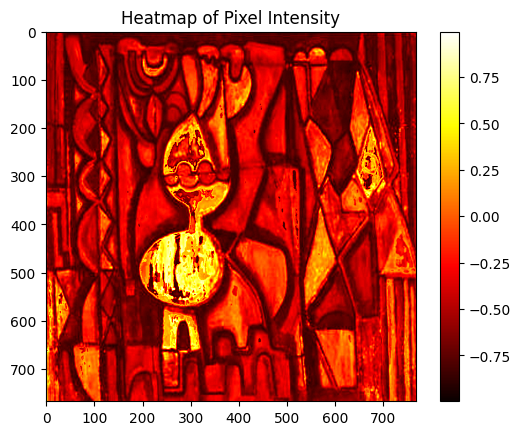

Heatmap for image 2


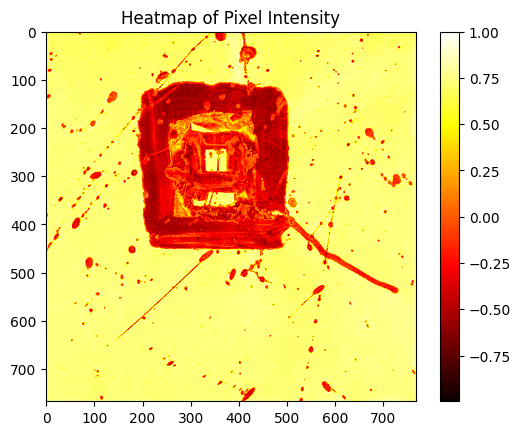

Heatmap for image 3


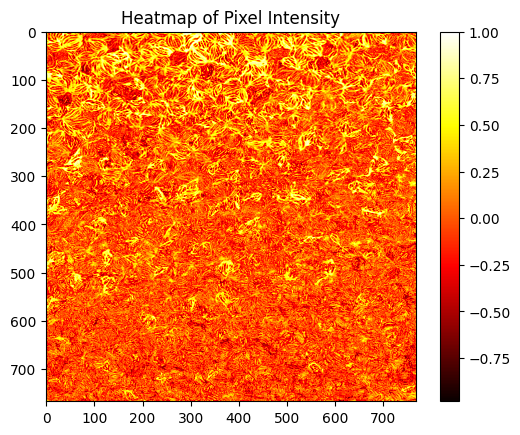

Heatmap for image 4


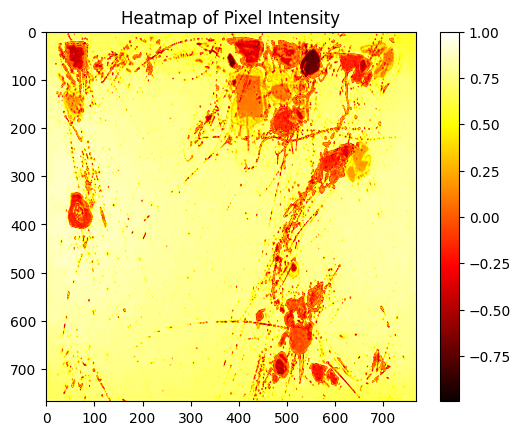

Heatmap for image 5


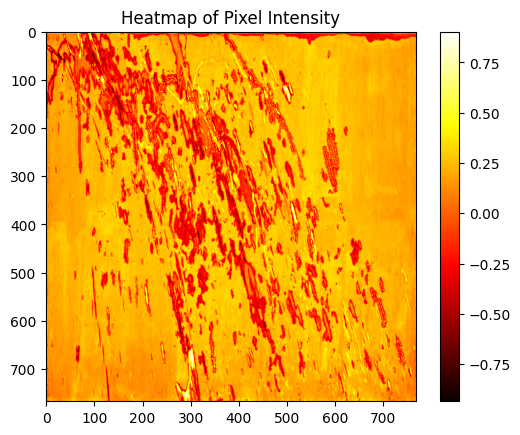

In [45]:
for idx, img in enumerate(train_art_images[:5]):
    print(f"Heatmap for image {idx + 1}")
    plot_heatmap(img)

# Augmentation
{Do not know if needed}

In [68]:
import cv2
import random, time;
def data_augmentation(image):
    random.seed(int(time.time()))

    #flip_horizontal = image.transpose(Image.FLIP_LEFT_RIGHT)
    crop_x = random.randint(30, 100)
    crop_y = random.randint(40, 100)
    h, w, c = image.shape
    cropped_image = image[crop_y:h - crop_y, crop_x:w - crop_x, :]

    # Resize back to original dimensions
    resized_image = cv2.resize(cropped_image, (w, h), interpolation=Image.BICUBIC)

    # Random rotation
    angle = random.uniform(-20, 20)
    center = (w // 2, h // 2)
    rotation_matrix = cv2.getRotationMatrix2D(center, angle, 1.0)  # No scaling during rotation
    rotated_image = cv2.warpAffine(resized_image, rotation_matrix, (w, h), flags=Image.BICUBIC)


    fig, axes = plt.subplots(1, 4, figsize=(15, 5))
    axes[0].imshow(image)
    axes[0].set_title("Original")
    axes[2].imshow(rotated_image)
    axes[2].set_title("Rotated")
    axes[3].imshow(resized_image)
    axes[3].set_title("Cropped")
    plt.show()


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


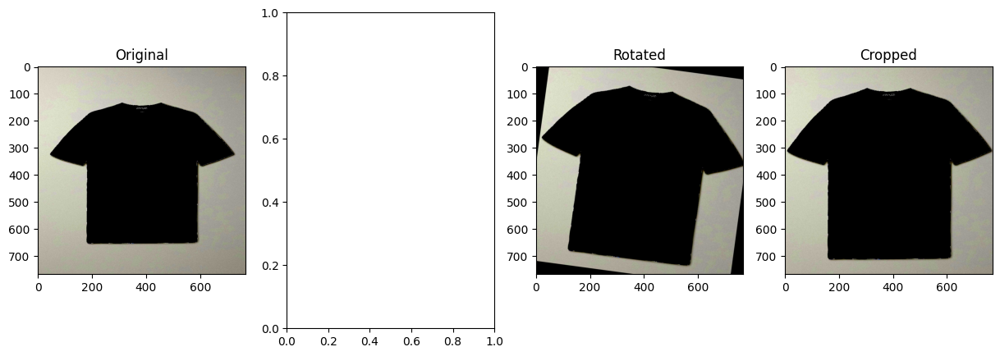

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


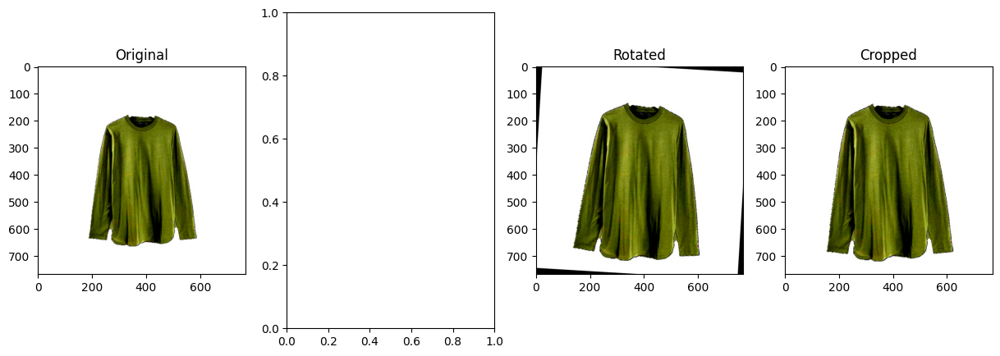

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


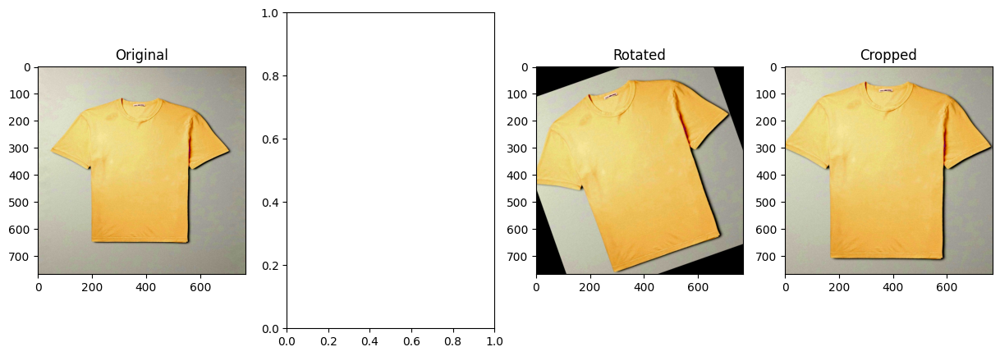

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


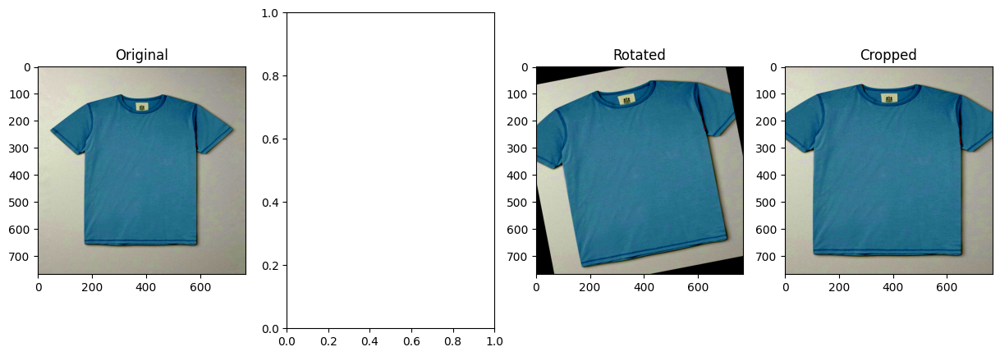

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


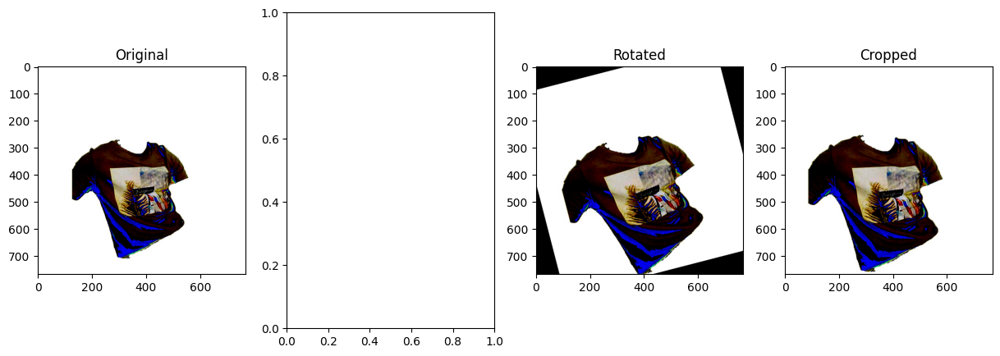

In [69]:
for img in test_shirt_images[5:10]:
    data_augmentation(img)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


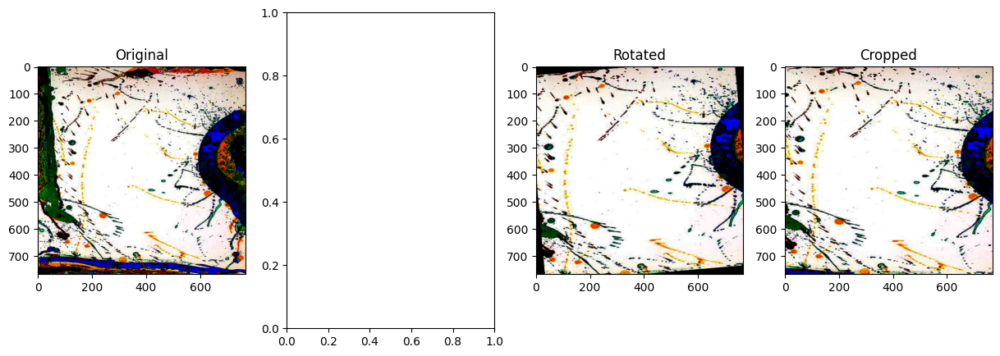

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


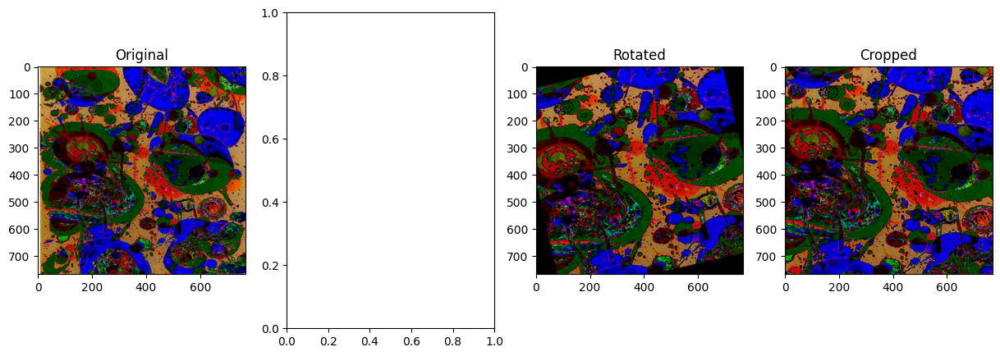

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


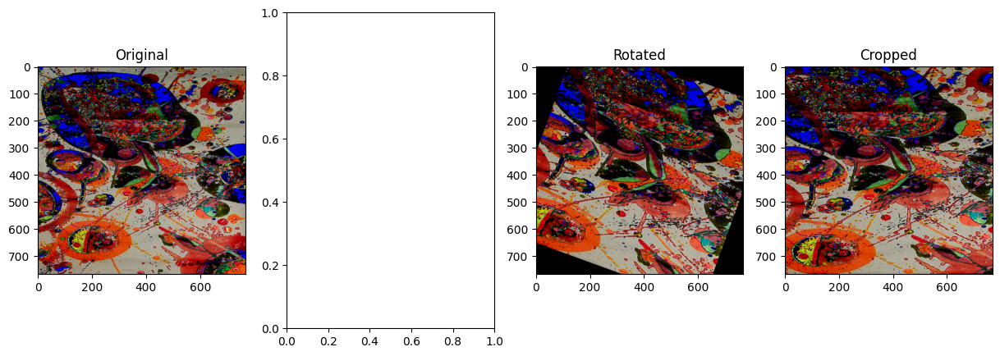

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


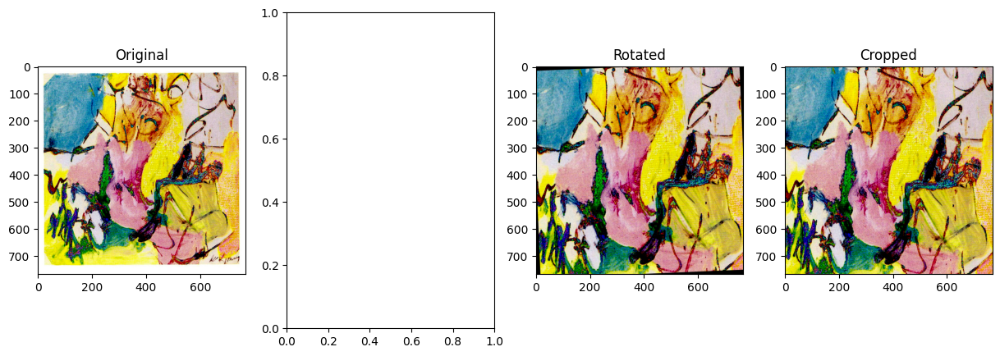

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


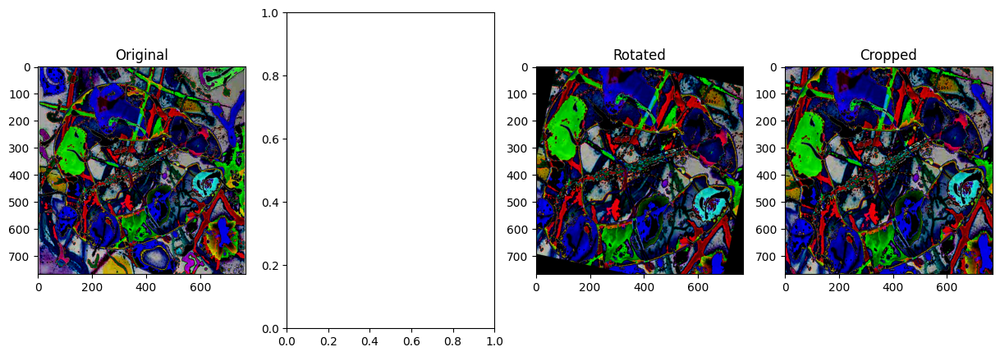

In [70]:
for img in test_art_images[5:10]:
    data_augmentation(img)